In [1]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
import os
import pandas as pd

In [2]:
from google.colab import drive
drive.mount('/content/MyDrive')

Drive already mounted at /content/MyDrive; to attempt to forcibly remount, call drive.mount("/content/MyDrive", force_remount=True).


In [3]:
folder_path = "/content/MyDrive/MyDrive/Dataset/2000_Features/"

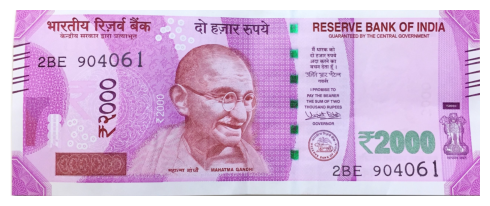

In [4]:
img = cv2.imread('/content/2000_s1.jpg')
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.tight_layout()
plt.show()

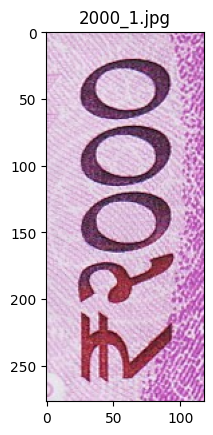

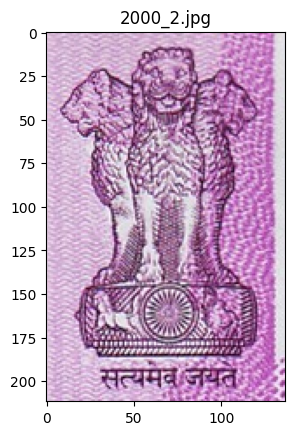

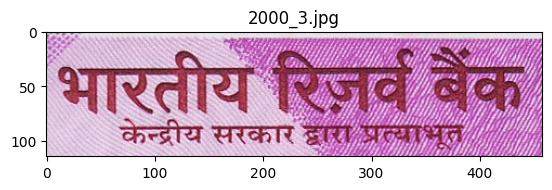

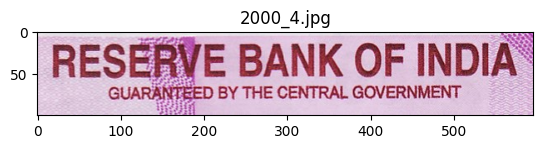

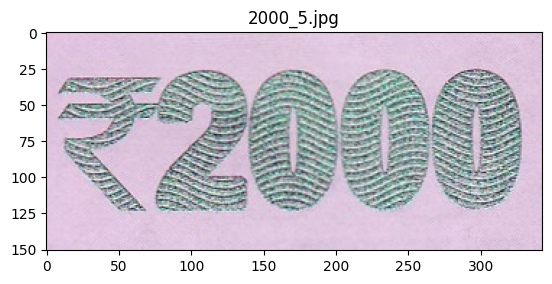

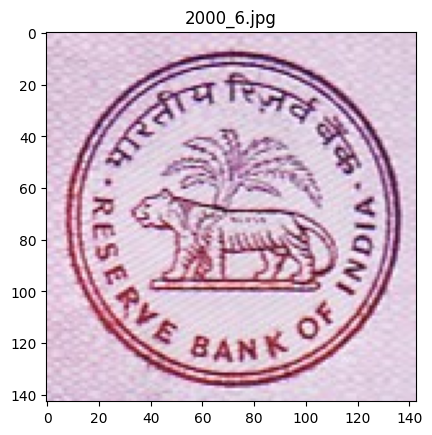

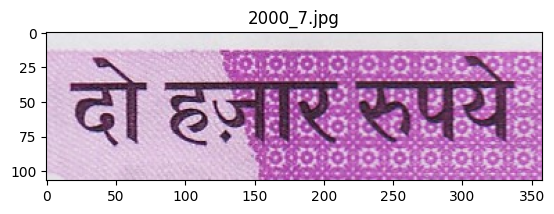

In [5]:
for filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, filename)
    try:
        img = cv2.imread(image_path)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(filename)
        plt.show()
    except Exception as e:
        print(f"Error processing image {filename}: {e}")

CALCULATING SSIM SCORE FOR TWO IMAGES

In [6]:
def calculateSSIM(template_img, query_img):
    min_w = min(template_img.shape[1], query_img.shape[1])
    min_h = min(template_img.shape[0], query_img.shape[0])

    # Resizing the two images so that both have the same dimensions
    img1 = cv2.resize(template_img, (min_w, min_h))
    img2 = cv2.resize(query_img, (min_w, min_h))

    # Conversion to grayscale
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Compute SSIM score
    score = ssim(img1, img2)
    return score

In [7]:
img1=cv2.imread('/content/2000_s1.jpg')
img2=cv2.imread('/content/2000_s2.jpg')
calculateSSIM(img1,img2)

0.263023832757299

CALCULATING ORB MATCHES FOR TWO IMAGES

In [8]:
def computeORB(template_img, query_img):
    # Initialize ORB detector
    orb = cv2.ORB_create(
        nfeatures=700,
        scaleFactor=1.2,
        nlevels=8,
        edgeThreshold=15
    )

    # Detect keypoints and descriptors
    kpts1, descs1 = orb.detectAndCompute(template_img, None)
    kpts2, descs2 = orb.detectAndCompute(query_img, None)

    # Brute Force Matcher
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(descs1, descs2)
    dmatches = sorted(matches, key=lambda x: x.distance)

    # Homography to identify template location in the query image
    src_pts = np.float32([kpts1[m.queryIdx].pt for m in dmatches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kpts2[m.trainIdx].pt for m in dmatches]).reshape(-1, 1, 2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    h, w = template_img.shape[:2]
    pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

    dst = cv2.perspectiveTransform(pts, M) if M is not None else None

    return dst, dst_pts, kpts1, kpts2, dmatches

In [9]:
img1=cv2.imread('/content/2000_s1.jpg')
img2=cv2.imread('/content/2000_s2.jpg')
computeORB(img1,img2)

(array([[[ 198.03294,   57.82539]],
 
        [[-310.4625 ,  817.4607 ]],
 
        [[1756.7227 , 1245.0327 ]],
 
        [[1285.1799 ,   -7.10643]]], dtype=float32),
 array([[[ 969.      ,   63.      ]],
 
        [[ 969.4081  ,   70.84801 ]],
 
        [[ 514.94403 ,   81.21601 ]],
 
        [[ 943.48816 ,   62.208008]],
 
        [[ 513.60004 ,   79.200005]],
 
        [[1121.8177  ,   43.545605]],
 
        [[ 969.60004 ,   72.      ]],
 
        [[1083.456   ,   46.656006]],
 
        [[ 252.28802 ,  330.04803 ]],
 
        [[1106.4     ,  442.80002 ]],
 
        [[1044.      ,   50.      ]],
 
        [[ 179.71202 ,   60.480007]],
 
        [[ 991.8721  ,   65.66401 ]],
 
        [[ 964.2241  ,   55.296005]],
 
        [[1088.4     ,   52.800003]],
 
        [[1064.4481  ,   65.66401 ]],
 
        [[ 970.56006 ,   61.920002]],
 
        [[1144.6273  ,   41.472008]],
 
        [[ 971.1361  ,   60.480007]],
 
        [[ 950.      ,   77.      ]],
 
        [[ 969.60004 ,   62.4    

PROCESSING IMAGES

In [10]:
def process_images(currency_img_path, emblem_folder_path):
    # Load the currency note
    currency_img = cv2.imread(currency_img_path)

    # Load emblem templates from the folder
    emblem_images = [cv2.imread(os.path.join(emblem_folder_path, img))
                     for img in os.listdir(emblem_folder_path) if img.endswith('.jpg')]

    # Results
    best_ssim = 0
    best_match = None
    orb_detected = False

    for idx, emblem in enumerate(emblem_images):
        print(f"Analyzing template {idx + 1}...")

        # SSIM Analysis
        ssim_score = calculateSSIM(emblem, currency_img)
        print(f"SSIM Score: {ssim_score}")

        # ORB Analysis
        dst, dst_pts, kpts1, kpts2, dmatches = computeORB(emblem, currency_img)
        print(f"ORB Matches Found: {len(dmatches)}")

        if dst is not None:
            orb_detected = True

            # Draw matches for visualization
            match_img = cv2.drawMatches(emblem, kpts1, currency_img, kpts2, dmatches[:10], None, flags=2)
            plt.figure(figsize=(12, 6))
            plt.imshow(match_img)
            plt.title(f"Feature {idx + 1} Matches")
            plt.show()

        # Update best match if SSIM score improves
        if ssim_score > best_ssim:
            best_ssim = ssim_score
            best_match = idx

    print(f"Best Match: Feature {best_match + 1} with SSIM {best_ssim}")
    if orb_detected:
        print("ORB detected the feature successfully.")
    else:
        print("ORB failed to detect the feature.")

FEATURE 1 - ₹2000 Symbol

Analyzing template 1...
SSIM Score: 0.11302203031756411
ORB Matches Found: 111


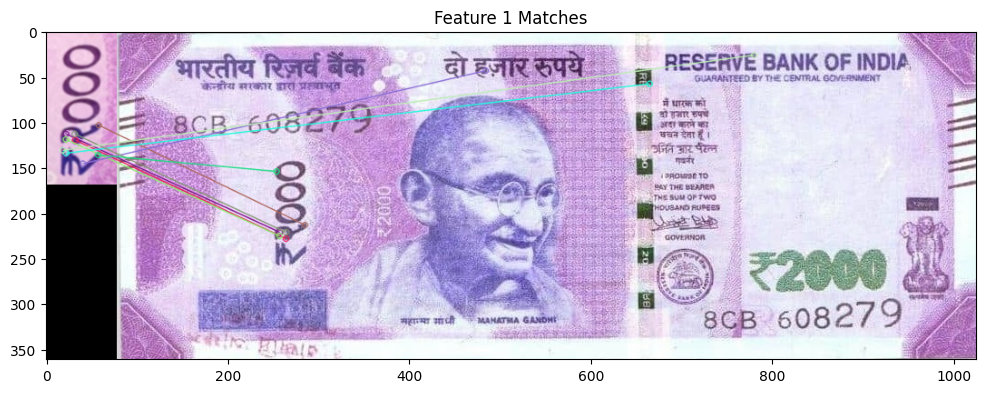

Analyzing template 2...
SSIM Score: 0.11587128455468944
ORB Matches Found: 96


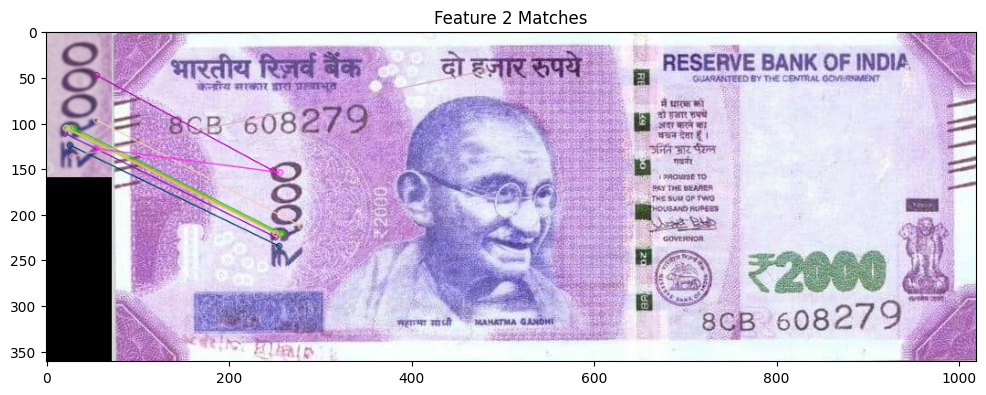

Analyzing template 3...
SSIM Score: 0.11393102018117116
ORB Matches Found: 104


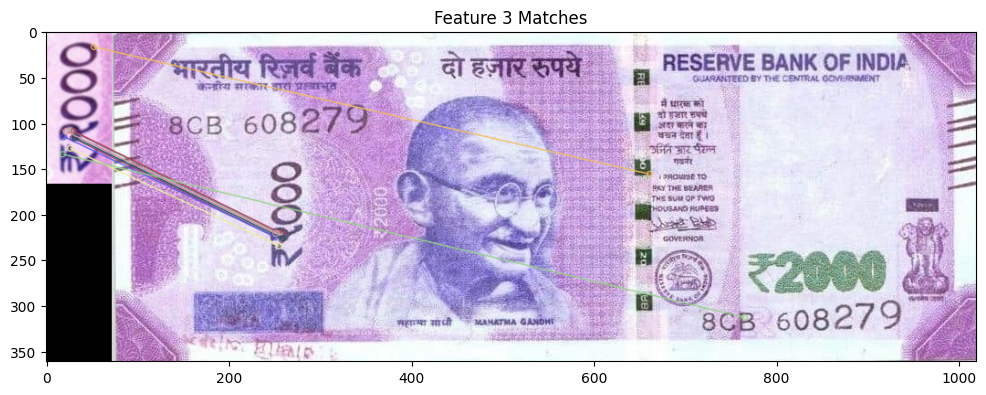

Analyzing template 4...
SSIM Score: 0.10518573243762405
ORB Matches Found: 95


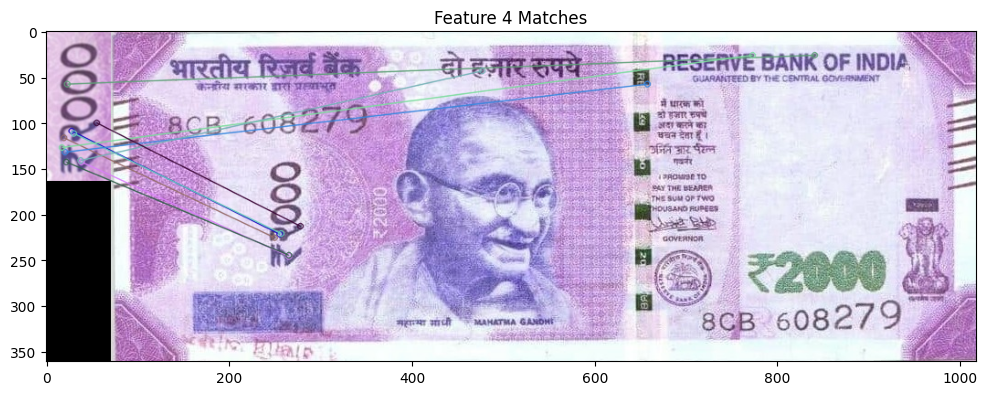

Analyzing template 5...
SSIM Score: 0.08601460102520508
ORB Matches Found: 124


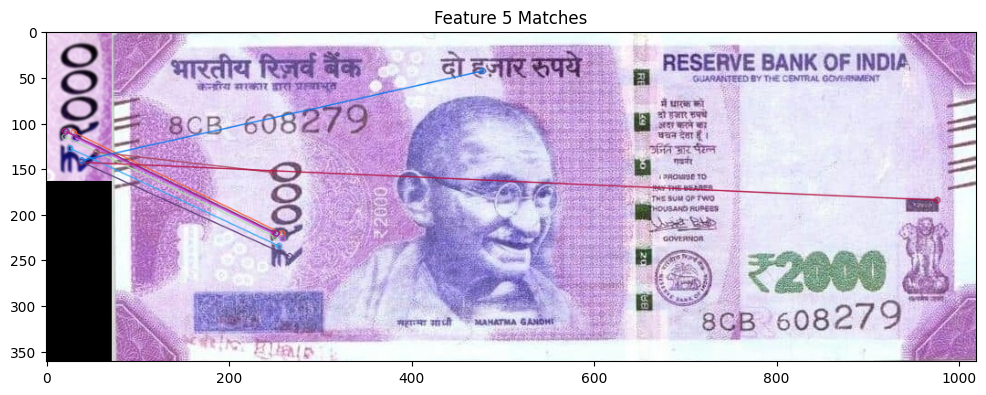

Analyzing template 6...
SSIM Score: 0.07476597769929359
ORB Matches Found: 170


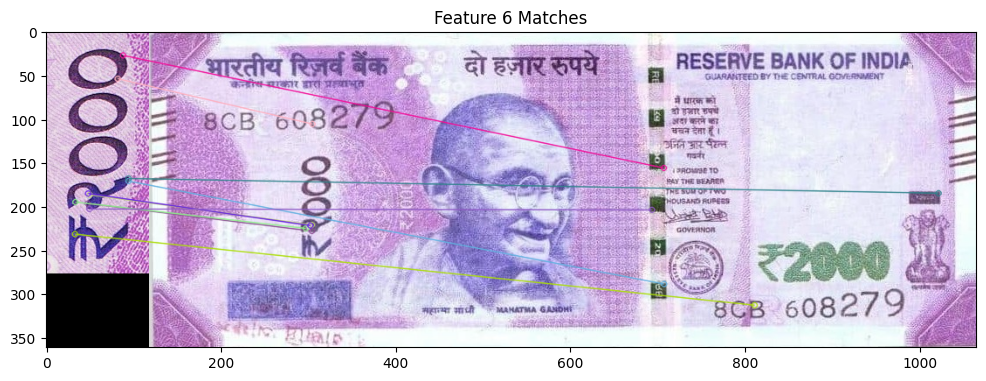

Best Match: Feature 2 with SSIM 0.11587128455468944
ORB detected the feature successfully.


In [11]:
# Input paths
currency_img_path = "/content/2000_s9.jpg"
folder_path = "/content/MyDrive/MyDrive/Dataset/2000_Features Dataset/Feature 1"

# Call the process_images function
process_images(currency_img_path, folder_path)

FEATURE 2 - Indian Emblem

Analyzing template 1...
SSIM Score: 0.09931618613903359
ORB Matches Found: 95


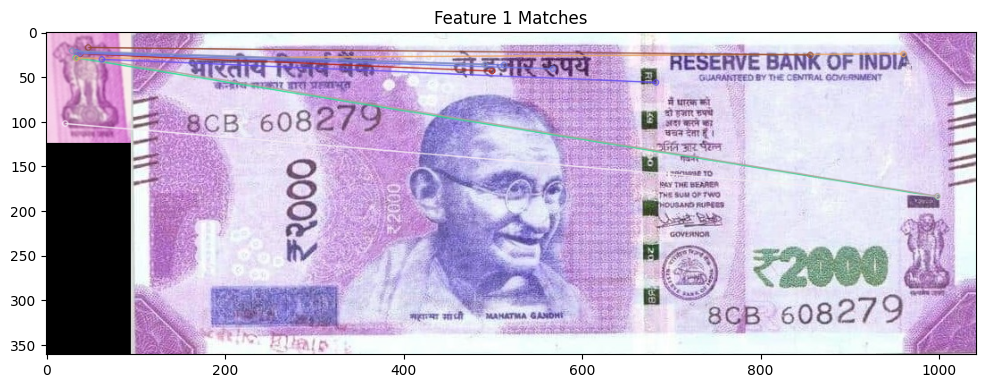

Analyzing template 2...
SSIM Score: 0.10139335475008537
ORB Matches Found: 55


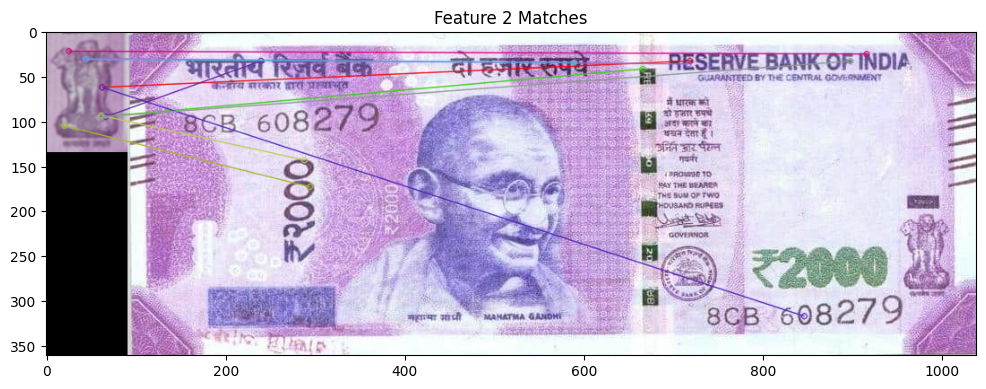

Analyzing template 3...
SSIM Score: 0.07141373800404224
ORB Matches Found: 80


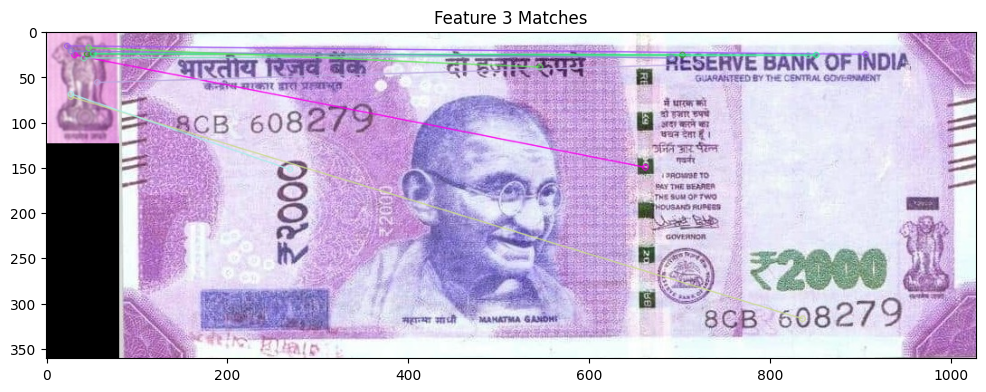

Analyzing template 4...
SSIM Score: 0.07414075968960313
ORB Matches Found: 86


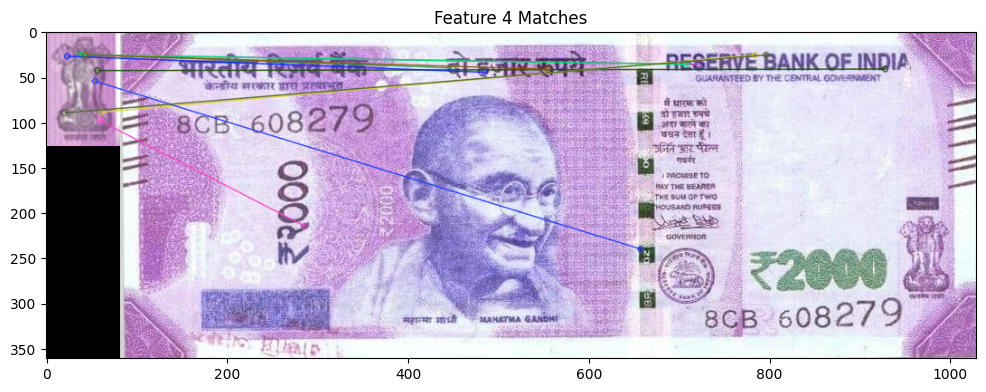

Analyzing template 5...
SSIM Score: 0.06840648712209754
ORB Matches Found: 122


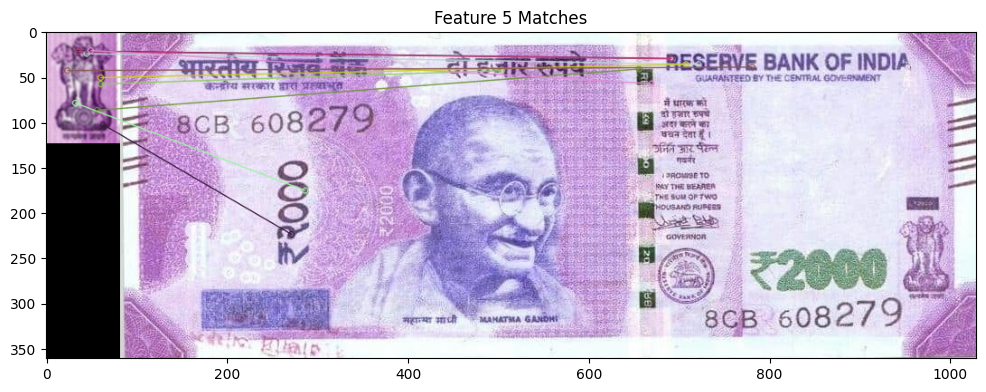

Analyzing template 6...
SSIM Score: 0.04380984120118405
ORB Matches Found: 185


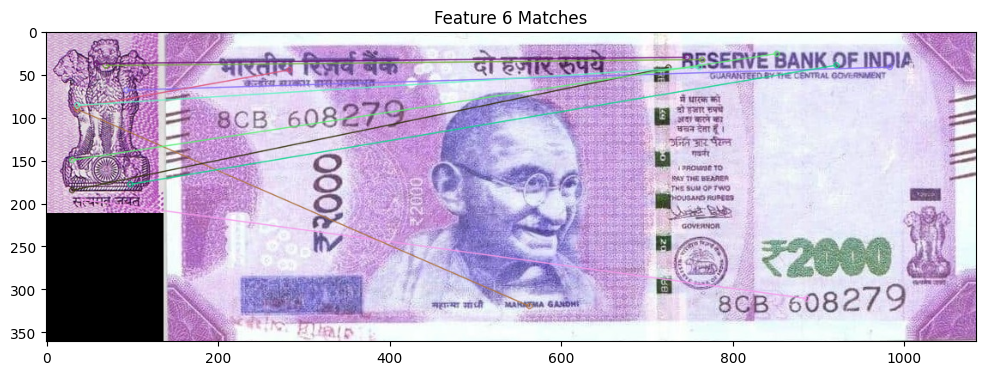

Best Match: Feature 2 with SSIM 0.10139335475008537
ORB detected the feature successfully.


In [12]:
# Input paths
currency_img_path = "/content/2000_s9.jpg"  # Update with the actual currency note file
emblem_folder_path = "/content/MyDrive/MyDrive/Dataset/2000_Features Dataset/Feature 2"

# Call the process_images function
process_images(currency_img_path, emblem_folder_path)


FEATURE 3 - भारतीय रिजर्व बैंक Symbol

Analyzing template 1...
SSIM Score: 0.07046163149561602
ORB Matches Found: 148


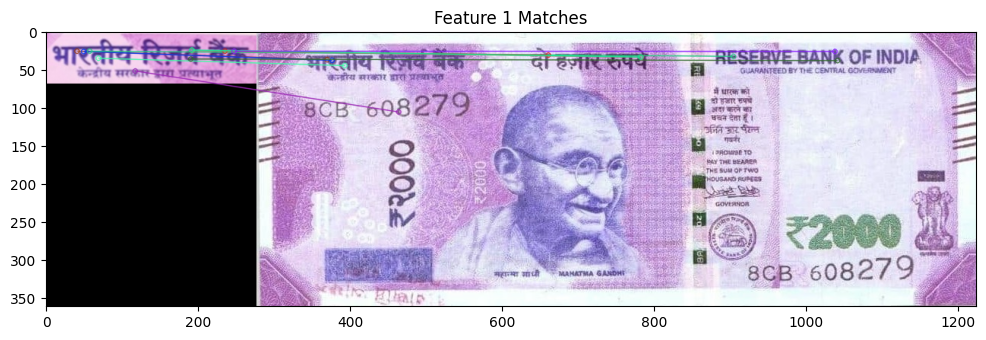

Analyzing template 2...
SSIM Score: 0.09345900308115647
ORB Matches Found: 138


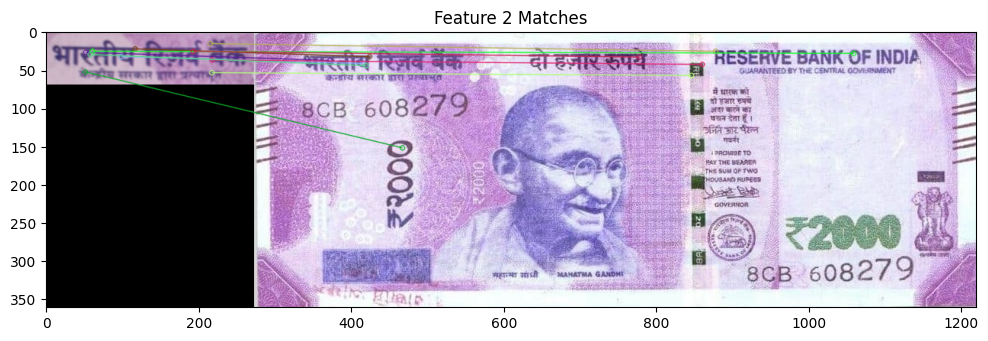

Analyzing template 3...
SSIM Score: 0.06727285924004199
ORB Matches Found: 161


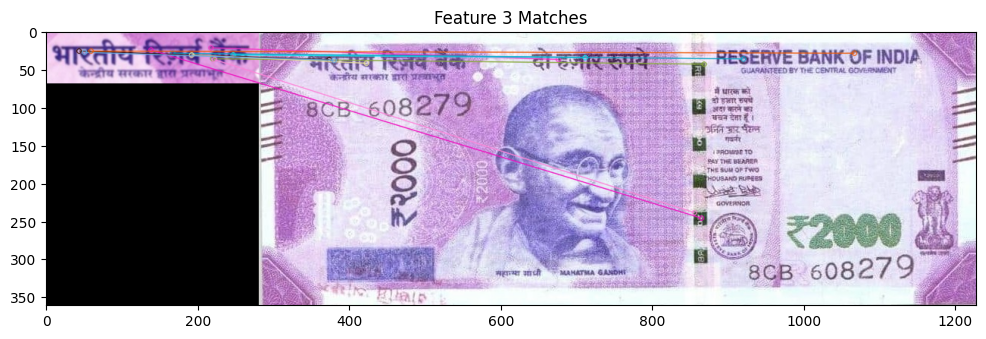

Analyzing template 4...
SSIM Score: 0.08240457552972029
ORB Matches Found: 142


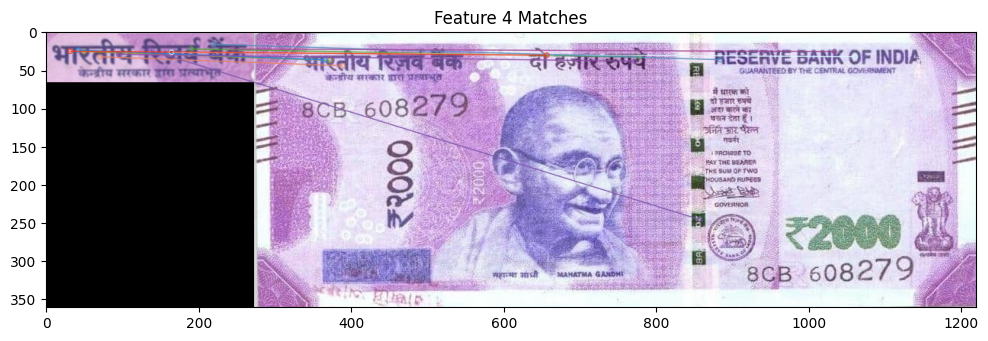

Analyzing template 5...
SSIM Score: 0.07669876172513597
ORB Matches Found: 162


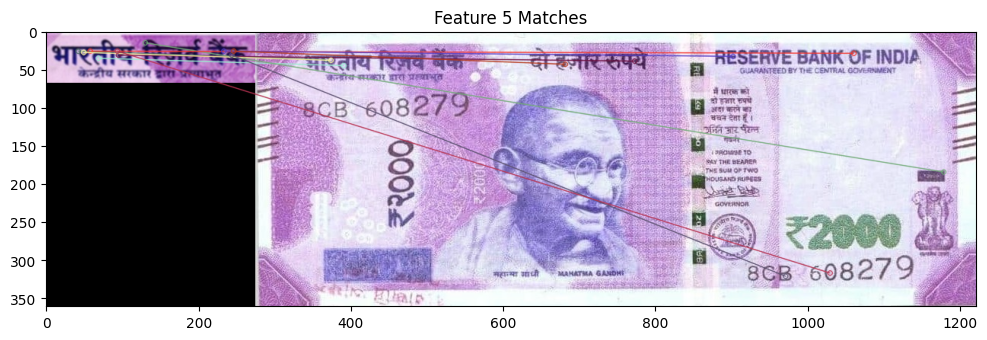

Analyzing template 6...
SSIM Score: 0.06361980193220979
ORB Matches Found: 208


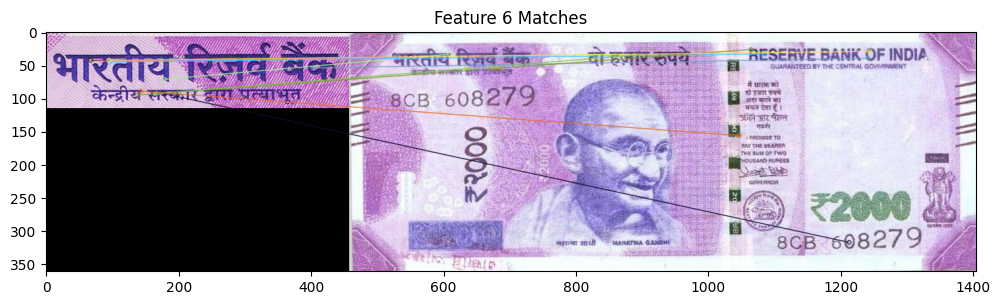

Best Match: Feature 2 with SSIM 0.09345900308115647
ORB detected the feature successfully.


In [13]:
# Input paths
currency_img_path = "/content/2000_s9.jpg"  # Update with the actual currency note file
emblem_folder_path = "/content/MyDrive/MyDrive/Dataset/2000_Features Dataset/Feature 3"

# Call the process_images function
process_images(currency_img_path, emblem_folder_path)

Feature 4 - RESERVE BANK OF INDIA Symbol

Analyzing template 1...
SSIM Score: 0.033277346213558094
ORB Matches Found: 163


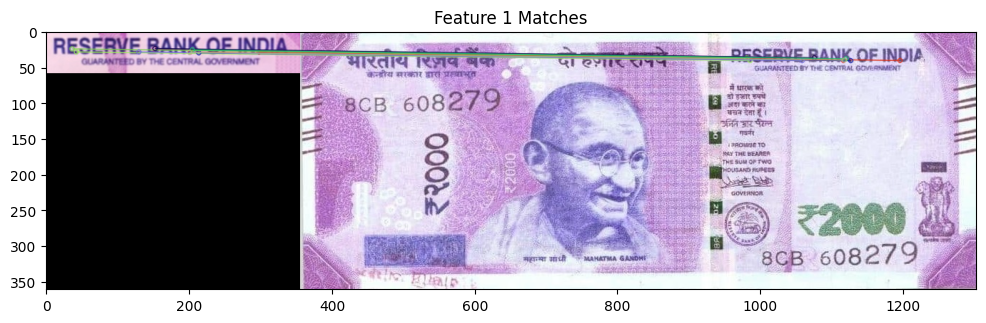

Analyzing template 2...
SSIM Score: 0.059481409833345954
ORB Matches Found: 193


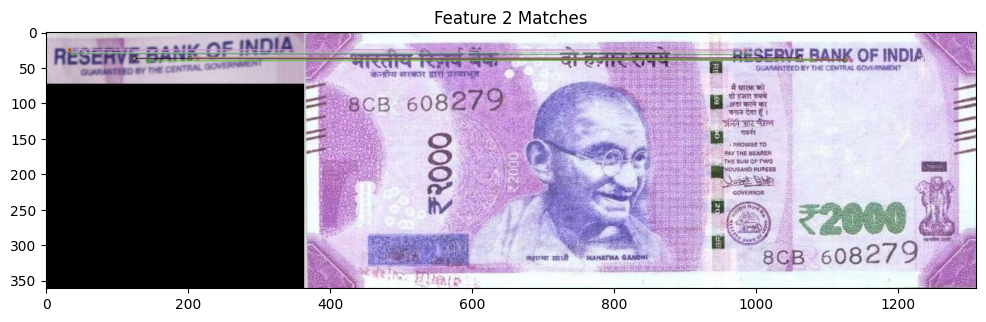

Analyzing template 3...
SSIM Score: 0.04922240834317036
ORB Matches Found: 172


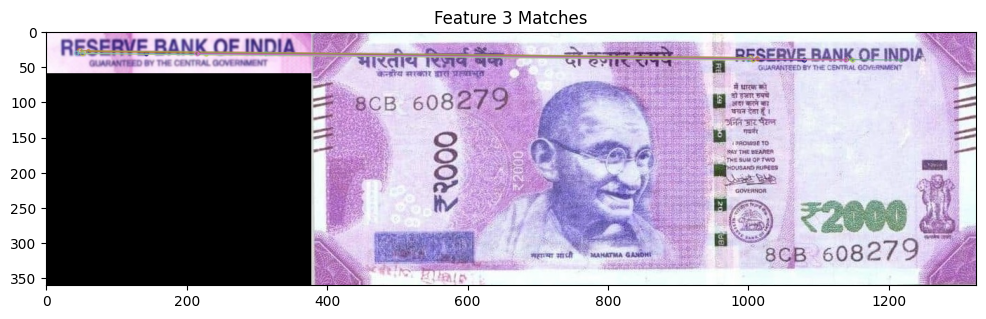

Analyzing template 4...
SSIM Score: 0.028066480621232858
ORB Matches Found: 160


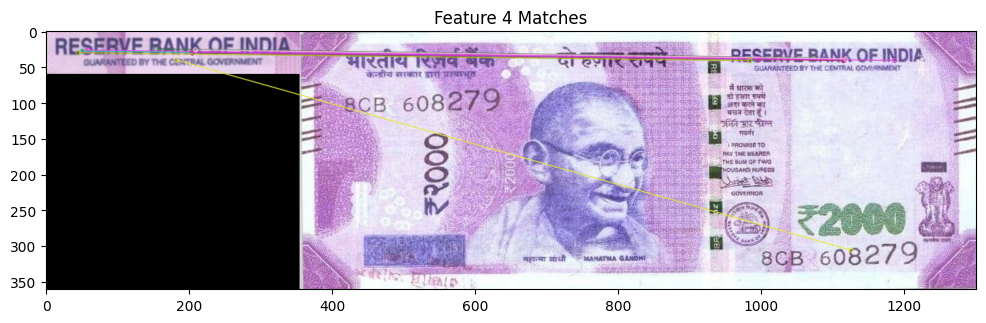

Analyzing template 5...
SSIM Score: 0.02722353284759234
ORB Matches Found: 156


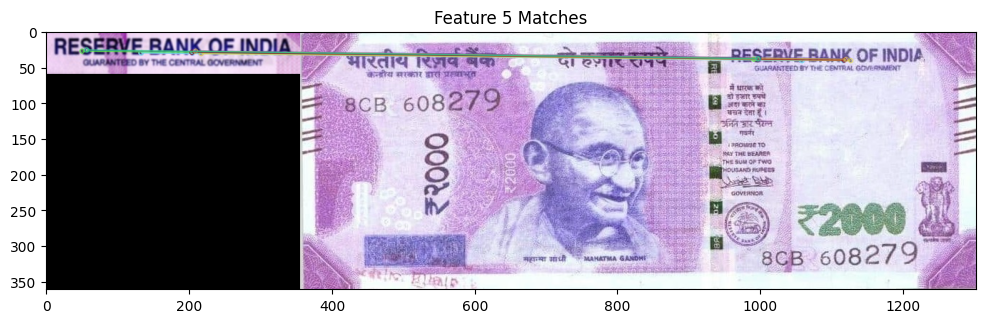

Analyzing template 6...
SSIM Score: 0.08459171870988748
ORB Matches Found: 199


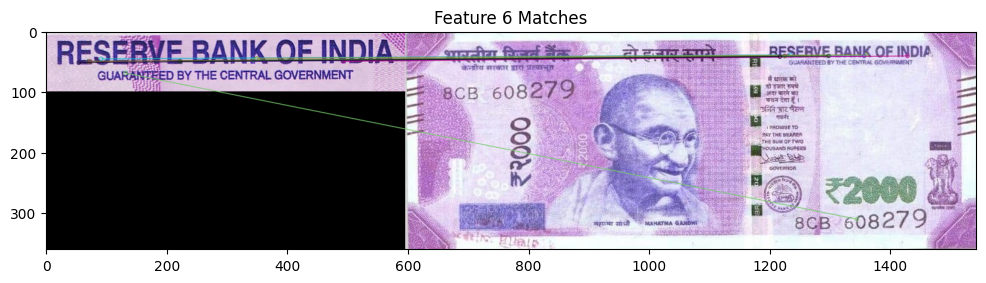

Best Match: Feature 6 with SSIM 0.08459171870988748
ORB detected the feature successfully.


In [14]:
# Input paths
currency_img_path = "/content/2000_s9.jpg"  # Update with the actual currency note file
emblem_folder_path = "/content/MyDrive/MyDrive/Dataset/2000_Features Dataset/Feature 4"

# Call the process_images function
process_images(currency_img_path, emblem_folder_path)

This can be repeated for all the features in the Currency Note

Complete Code

Fake Note

In [15]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
import os
import pandas as pd

# Inputs
currency_img_path = "/content/2000_f5.jpg"  # Path to the currency note
features_folder_paths = [  # Paths to all feature folders
    f"/content/MyDrive/MyDrive/Dataset/2000_Features Dataset/Feature {i}"
    for i in range(1, 8)
]

# Thresholds
SSIM_THRESHOLD = 0.1
ORB_MATCH_THRESHOLD = 120

# Define evaluation matrix
evaluation_matrix = []

# SSIM Calculation Function
def calculateSSIM(template_img, query_img):
    min_w = min(template_img.shape[1], query_img.shape[1])
    min_h = min(template_img.shape[0], query_img.shape[0])

    # Resize images to the minimum width and height
    img1 = cv2.resize(template_img, (min_w, min_h))
    img2 = cv2.resize(query_img, (min_w, min_h))

    # Convert to grayscale
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Compute SSIM score
    score = ssim(img1, img2)
    return score

# ORB Calculation Function
def computeORB(template_img, query_img):
    orb = cv2.ORB_create(
        nfeatures=700,
        scaleFactor=1.2,
        nlevels=8,
        edgeThreshold=15
    )

    kpts1, descs1 = orb.detectAndCompute(template_img, None)
    kpts2, descs2 = orb.detectAndCompute(query_img, None)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(descs1, descs2)
    dmatches = sorted(matches, key=lambda x: x.distance)

    return len(dmatches)  # Return number of matches found

# Process Images for Each Feature
def process_feature(currency_img_path, emblem_folder_path, feature_name):
    # Load the currency image
    currency_img = cv2.imread(currency_img_path)

    # Load emblem images from the feature folder
    emblem_images = [
        cv2.imread(os.path.join(emblem_folder_path, img))
        for img in os.listdir(emblem_folder_path) if img.endswith('.jpg')
    ]

    ssim_scores = []
    orb_matches = []

    print(f"\nAnalyzing {feature_name} ...")  # Dynamic feature name

    for template_count, emblem in enumerate(emblem_images, start=1):
        print(f"--> Template {template_count}:")

        # SSIM Analysis
        ssim_score = calculateSSIM(emblem, currency_img)
        print(f"    SSIM Score: {ssim_score}")
        ssim_scores.append(ssim_score)

        # ORB Analysis
        orb_match_count = computeORB(emblem, currency_img)
        print(f"    ORB Matches Found: {orb_match_count}")
        orb_matches.append(orb_match_count)

    # Calculate thresholds
    # median_ssim =0.1
    median_ssim = np.median(ssim_scores)
    median_orb = np.median(orb_matches)
    # median_orb = 120

    # Determine the majority classification for this feature
    fake_count = sum(
        1 for score, orb in zip(ssim_scores, orb_matches)
        if score < median_ssim or orb < median_orb
    )
    real_count = len(ssim_scores) - fake_count

    feature_result = "FAKE" if fake_count > real_count else "REAL"

    # Add result to evaluation matrix
    evaluation_matrix.append({
        "Feature": feature_name,
        "Median SSIM Score": median_ssim,
        "Median ORB Matches": median_orb,
        "Fake Count": fake_count,
        "Real Count": real_count,
        "Result": feature_result
    })

# Main Processing Loop for All Features
for i, feature_folder in enumerate(features_folder_paths, start=1):
    process_feature(currency_img_path, feature_folder, f"Feature {i}")

# Final Classification
total_fake_features = sum(1 for feature in evaluation_matrix if feature["Result"] == "FAKE")
total_real_features = len(evaluation_matrix) - total_fake_features
final_result = "FAKE" if total_fake_features > total_real_features else "REAL"

# Display the evaluation matrix
evaluation_df = pd.DataFrame(evaluation_matrix)
print("\nEvaluation Matrix:")
print(evaluation_df[['Feature','Fake Count','Real Count','Result']])

# Print final classification result
# print(f"\nFinal Classification: The currency is {final_result}.")

# Calculate probabilities
total_features = len(evaluation_matrix)
probability_real = (total_real_features / total_features) * 100
probability_fake = (total_fake_features / total_features) * 100

# Display probabilities
print(f"\nProbability of being REAL: {probability_real:.2f}%")
print(f"Probability of being FAKE: {probability_fake:.2f}%")

# Save the evaluation matrix to a CSV file
# evaluation_df.to_csv('/content/evaluation_results_all_features.csv', index=False)



Analyzing Feature 1 ...
--> Template 1:
    SSIM Score: 0.1183729263242315
    ORB Matches Found: 104
--> Template 2:
    SSIM Score: 0.11387601941381126
    ORB Matches Found: 75
--> Template 3:
    SSIM Score: 0.10884715242620509
    ORB Matches Found: 125
--> Template 4:
    SSIM Score: 0.10093927578714812
    ORB Matches Found: 87
--> Template 5:
    SSIM Score: 0.08926599150305656
    ORB Matches Found: 121
--> Template 6:
    SSIM Score: 0.06740745506883854
    ORB Matches Found: 169

Analyzing Feature 2 ...
--> Template 1:
    SSIM Score: 0.09579584190926105
    ORB Matches Found: 86
--> Template 2:
    SSIM Score: 0.10211379559585637
    ORB Matches Found: 58
--> Template 3:
    SSIM Score: 0.09086956995010483
    ORB Matches Found: 75
--> Template 4:
    SSIM Score: 0.08247298012041827
    ORB Matches Found: 80
--> Template 5:
    SSIM Score: 0.07235926590445906
    ORB Matches Found: 126
--> Template 6:
    SSIM Score: 0.03324260451247211
    ORB Matches Found: 170

Analyzin

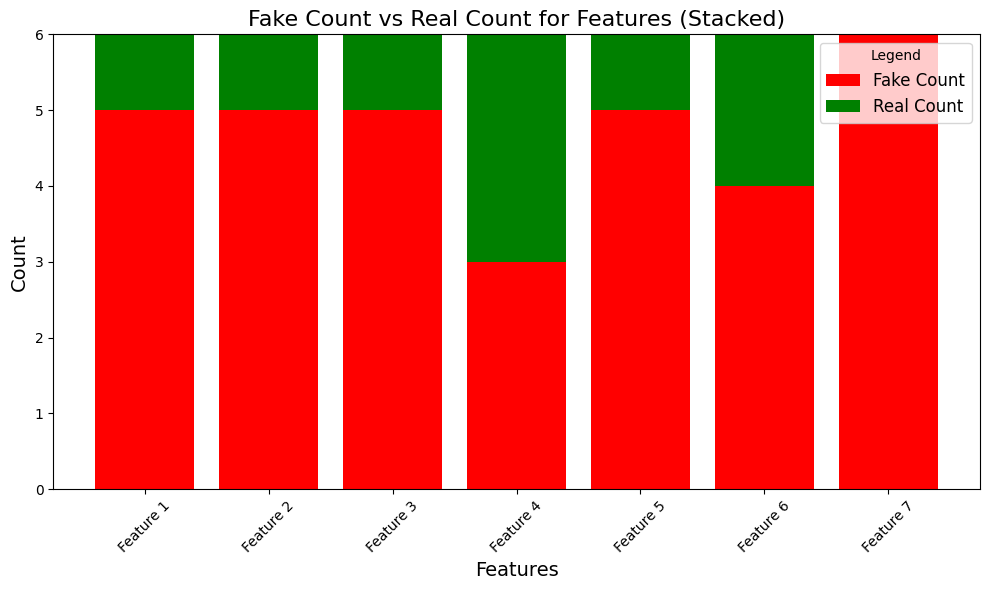

In [16]:
# Prepare the data for stacking
evaluation_df['Total Count'] = evaluation_df['Fake Count'] + evaluation_df['Real Count']

# Plot
plt.figure(figsize=(10, 6))
plt.bar(evaluation_df['Feature'], evaluation_df['Fake Count'], color='red', label='Fake Count')
plt.bar(evaluation_df['Feature'], evaluation_df['Real Count'], bottom=evaluation_df['Fake Count'], color='green', label='Real Count')

# Adding labels and legend
plt.title("Fake Count vs Real Count for Features (Stacked)", fontsize=16)
plt.xlabel("Features", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.legend(title="Legend", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

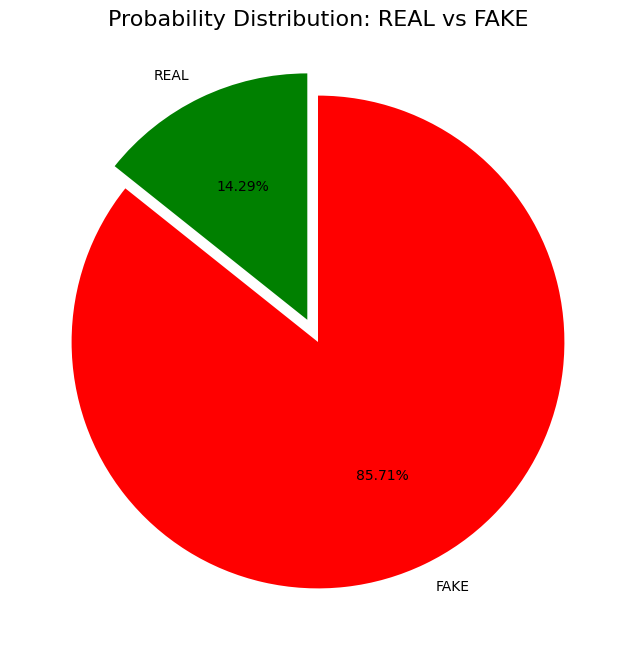

In [17]:
# Pie chart for Probabilities
probabilities = [probability_real, probability_fake]
labels = ['REAL', 'FAKE']
colors = ['green', 'red']

plt.figure(figsize=(8, 8))
plt.pie(
    probabilities,
    labels=labels,
    autopct='%1.2f%%',
    startangle=90,
    colors=colors,
    explode=(0.1, 0)  # Highlight "REAL" section
)
plt.title("Probability Distribution: REAL vs FAKE", fontsize=16)
plt.show()


Real Note

In [18]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
import os
import pandas as pd

# Inputs
currency_img_path = "/content/2000_s1.jpg"  # Path to the currency note
features_folder_paths = [  # Paths to all feature folders
    f"/content/MyDrive/MyDrive/Dataset/2000_Features Dataset/Feature {i}"
    for i in range(1, 8)
]

# Thresholds
SSIM_THRESHOLD = 0.85
# SSIM_THRESHOLD = 0.85
# ORB_MATCH_THRESHOLD = 100
ORB_MATCH_THRESHOLD = 100

# Define evaluation matrix
evaluation_matrix = []

# SSIM Calculation Function
def calculateSSIM(template_img, query_img):
    min_w = min(template_img.shape[1], query_img.shape[1])
    min_h = min(template_img.shape[0], query_img.shape[0])

    # Resize images to the minimum width and height
    img1 = cv2.resize(template_img, (min_w, min_h))
    img2 = cv2.resize(query_img, (min_w, min_h))

    # Convert to grayscale
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Compute SSIM score
    score = ssim(img1, img2)
    return score

# ORB Calculation Function
def computeORB(template_img, query_img):
    orb = cv2.ORB_create(
        nfeatures=700,
        scaleFactor=1.2,
        nlevels=8,
        edgeThreshold=15
    )

    kpts1, descs1 = orb.detectAndCompute(template_img, None)
    kpts2, descs2 = orb.detectAndCompute(query_img, None)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(descs1, descs2)
    dmatches = sorted(matches, key=lambda x: x.distance)

    return len(dmatches)  # Return number of matches found

# Process Images for Each Feature
def process_feature(currency_img_path, emblem_folder_path, feature_name):
    # Load the currency image
    currency_img = cv2.imread(currency_img_path)

    # Load emblem images from the feature folder
    emblem_images = [
        cv2.imread(os.path.join(emblem_folder_path, img))
        for img in os.listdir(emblem_folder_path) if img.endswith('.jpg')
    ]

    ssim_scores = []
    orb_matches = []

    print(f"\nAnalyzing {feature_name} ...")  # Dynamic feature name

    for template_count, emblem in enumerate(emblem_images, start=1):
        print(f"--> Template {template_count}:")

        # SSIM Analysis
        ssim_score = calculateSSIM(emblem, currency_img)
        print(f"    SSIM Score: {ssim_score}")
        ssim_scores.append(ssim_score)

        # ORB Analysis
        orb_match_count = computeORB(emblem, currency_img)
        print(f"    ORB Matches Found: {orb_match_count}")
        orb_matches.append(orb_match_count)

    # Calculate thresholds
    median_ssim =0.05
    # median_ssim = np.median(ssim_scores)
    # median_orb = np.median(orb_matches)
    median_orb = 70

    # Determine the majority classification for this feature
    fake_count = sum(
        1 for score, orb in zip(ssim_scores, orb_matches)
        if score < median_ssim or orb < median_orb
    )
    real_count = len(ssim_scores) - fake_count

    feature_result = "FAKE" if fake_count > real_count else "REAL"

    # Add result to evaluation matrix
    evaluation_matrix.append({
        "Feature": feature_name,
        "Median SSIM Score": median_ssim,
        "Median ORB Matches": median_orb,
        "Fake Count": fake_count,
        "Real Count": real_count,
        "Result": feature_result
    })

# Main Processing Loop for All Features
for i, feature_folder in enumerate(features_folder_paths, start=1):
    process_feature(currency_img_path, feature_folder, f"Feature {i}")

# Final Classification
total_fake_features = sum(1 for feature in evaluation_matrix if feature["Result"] == "FAKE")
total_real_features = len(evaluation_matrix) - total_fake_features
final_result = "FAKE" if total_fake_features > total_real_features else "REAL"

# Display the evaluation matrix
evaluation_df = pd.DataFrame(evaluation_matrix)
print("\nEvaluation Matrix:")
print(evaluation_df[['Feature','Fake Count','Real Count','Result']])

# Print final classification result
# print(f"\nFinal Classification: The currency is {final_result}.")

# Calculate probabilities
total_features = len(evaluation_matrix)
probability_real = (total_real_features / total_features) * 100
probability_fake = (total_fake_features / total_features) * 100

# Display probabilities
print(f"\nProbability of being REAL: {probability_real:.2f}%")
print(f"Probability of being FAKE: {probability_fake:.2f}%")


# Save the evaluation matrix to a CSV file
# evaluation_df.to_csv('/content/evaluation_results_all_features.csv', index=False)



Analyzing Feature 1 ...
--> Template 1:
    SSIM Score: 0.11493664659989945
    ORB Matches Found: 111
--> Template 2:
    SSIM Score: 0.12177042019637871
    ORB Matches Found: 72
--> Template 3:
    SSIM Score: 0.11927433062671901
    ORB Matches Found: 109
--> Template 4:
    SSIM Score: 0.10375755641709994
    ORB Matches Found: 86
--> Template 5:
    SSIM Score: 0.09338043699139136
    ORB Matches Found: 125
--> Template 6:
    SSIM Score: 0.06286650686139687
    ORB Matches Found: 169

Analyzing Feature 2 ...
--> Template 1:
    SSIM Score: 0.07660339541618798
    ORB Matches Found: 86
--> Template 2:
    SSIM Score: 0.08305562172400574
    ORB Matches Found: 62
--> Template 3:
    SSIM Score: 0.057759325248802826
    ORB Matches Found: 79
--> Template 4:
    SSIM Score: 0.0628411910080732
    ORB Matches Found: 92
--> Template 5:
    SSIM Score: 0.05332344276531917
    ORB Matches Found: 122
--> Template 6:
    SSIM Score: 0.02566218012061699
    ORB Matches Found: 203

Analyzi

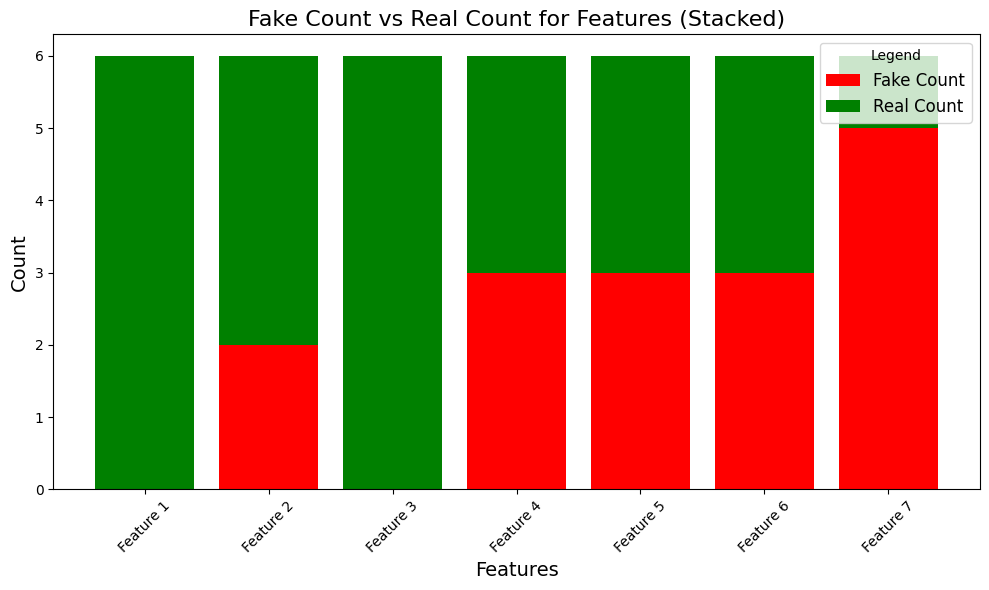

In [19]:
# Prepare the data for stacking
evaluation_df['Total Count'] = evaluation_df['Fake Count'] + evaluation_df['Real Count']

# Plot
plt.figure(figsize=(10, 6))
plt.bar(evaluation_df['Feature'], evaluation_df['Fake Count'], color='red', label='Fake Count')
plt.bar(evaluation_df['Feature'], evaluation_df['Real Count'], bottom=evaluation_df['Fake Count'], color='green', label='Real Count')

# Adding labels and legend
plt.title("Fake Count vs Real Count for Features (Stacked)", fontsize=16)
plt.xlabel("Features", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.legend(title="Legend", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


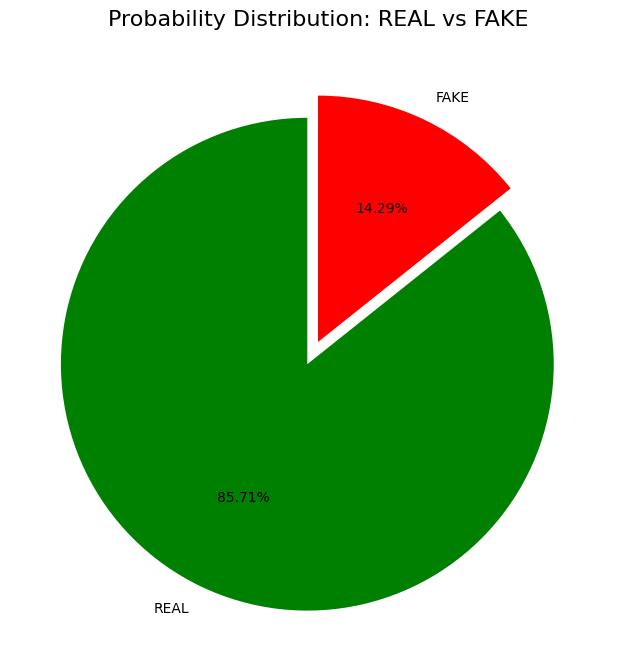

In [20]:
# Pie chart for Probabilities
probabilities = [probability_real, probability_fake]
labels = ['REAL', 'FAKE']
colors = ['green', 'red']

plt.figure(figsize=(8, 8))
plt.pie(
    probabilities,
    labels=labels,
    autopct='%1.2f%%',
    startangle=90,
    colors=colors,
    explode=(0.1, 0)  # Highlight "REAL" section
)
plt.title("Probability Distribution: REAL vs FAKE", fontsize=16)
plt.show()
